In [23]:
from matplotlib.animation import FuncAnimation
import matplotlib.pyplot as plt
import sounddevice as sd
import soundfile as sf
import numpy as np
import librosa

In [24]:
input_cleaned_filename = "mp3_input/bass_FLLS_clean.mp3"
x, sr = librosa.load(input_cleaned_filename)

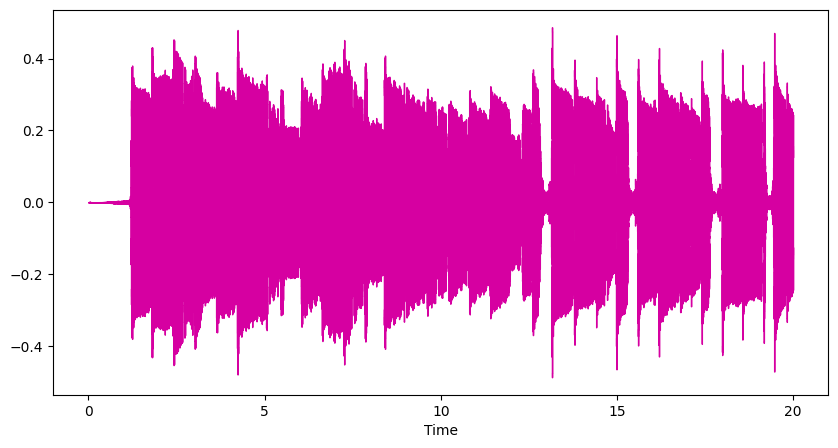

In [25]:
seconds_start = 0
seconds_end = 20
x_custom_time = x[seconds_start * sr :seconds_end*sr]

figure, axis = plt.subplots(1, figsize=(10, 5)) 

librosa.display.waveshow(x_custom_time, sr=sr, color = "#d600a1") 

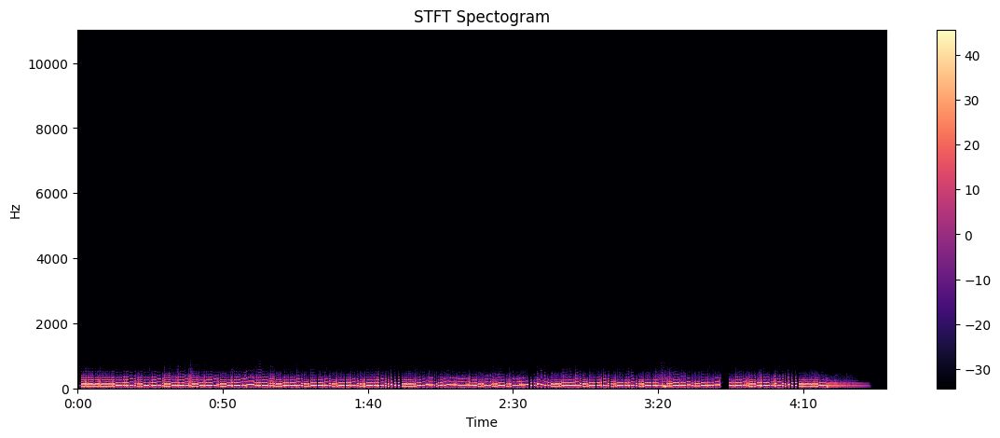

In [26]:
# x , sr = librosa.load(audio_path, sr = 22050) #loading the 11th file just for trial
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.title('STFT Spectogram')
plt.colorbar()

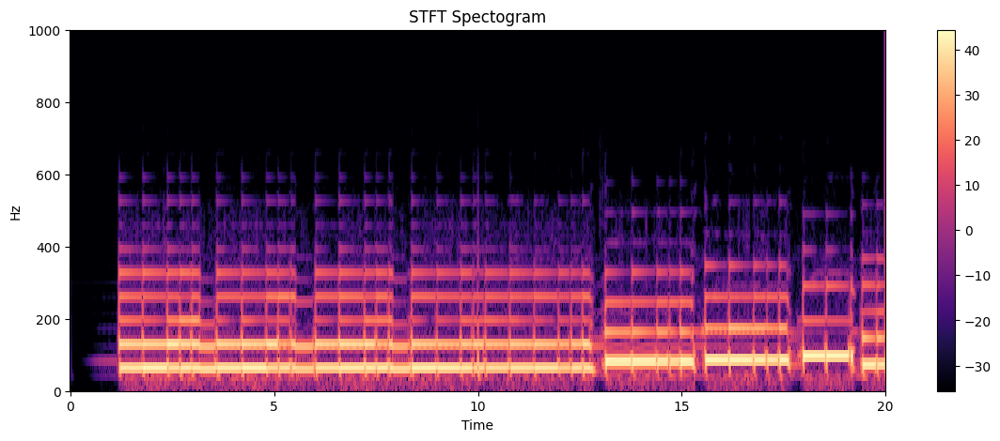

In [27]:
# x , sr = librosa.load(audio_path, sr = 22050) #loading the 11th file just for trial
X = librosa.stft(x_custom_time)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.ylim(0, 1000)
plt.title('STFT Spectogram')
plt.colorbar()

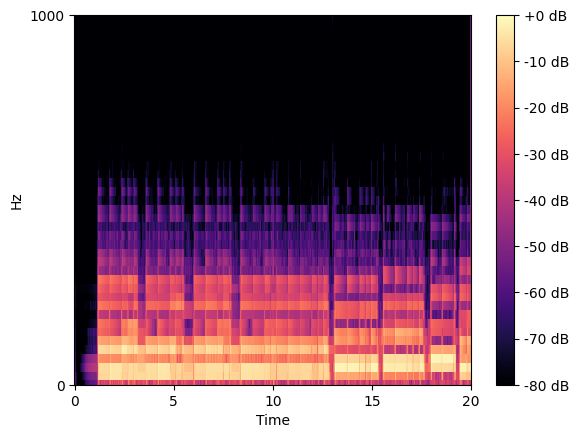

In [28]:
# mel spectrogram
S = librosa.feature.melspectrogram(y=x_custom_time, sr=sr)
fig, ax = plt.subplots()
S_dB = librosa.power_to_db(S, ref=np.max)
img = librosa.display.specshow(S_dB, x_axis='time',
                         y_axis='mel', sr=sr,
                         fmax=8000, ax=ax)
plt.ylim(0, 1000)
fig.colorbar(img, ax=ax, format='%+2.0f dB')


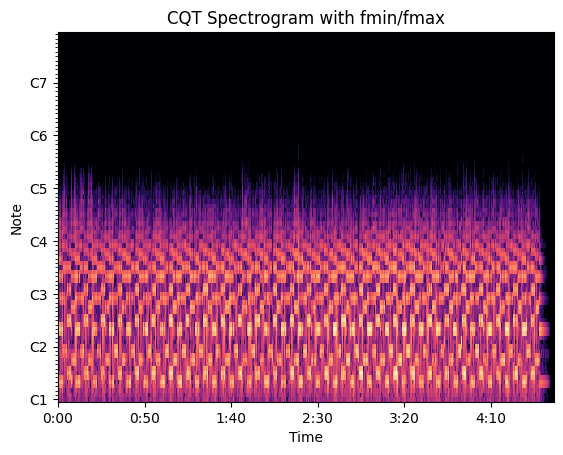

In [47]:
# Example with a CQT spectrogram
# y, sr = librosa.load(librosa.ex('trumpet'))
y, sr = librosa.load(input_cleaned_filename)
C = librosa.cqt(y=y, sr=sr)

fig, ax = plt.subplots()
img = librosa.display.specshow(
    librosa.amplitude_to_db(np.abs(C), ref=np.max),
    sr=sr,
    x_axis='time',
    y_axis='cqt_note', # Use a note-based y-axis
    # fmin=librosa.note_to_hz('C2'), # Set the minimum frequency
    # fmax=librosa.note_to_hz('C6'), # Set the maximum frequency
    ax=ax
)
ax.set(title='CQT Spectrogram with fmin/fmax')
plt.show()

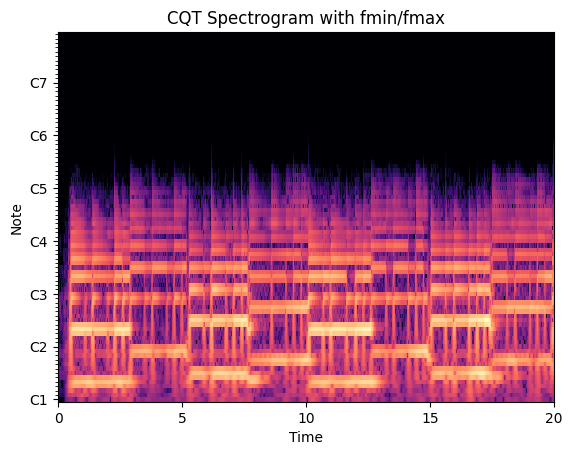

In [48]:
# Example with a CQT spectrogram
# y, sr = librosa.load(librosa.ex('trumpet'))
y, sr = librosa.load(input_cleaned_filename)
y = y[:seconds * sr]
C = librosa.cqt(y=y, sr=sr)

fig, ax = plt.subplots()
img = librosa.display.specshow(
    librosa.amplitude_to_db(np.abs(C), ref=np.max),
    sr=sr,
    x_axis='time',
    y_axis='cqt_note', # Use a note-based y-axis
    # fmin=librosa.note_to_hz('C2'), # Set the minimum frequency
    # fmax=librosa.note_to_hz('C6'), # Set the maximum frequency
    ax=ax
)
ax.set(title='CQT Spectrogram with fmin/fmax')
plt.show()

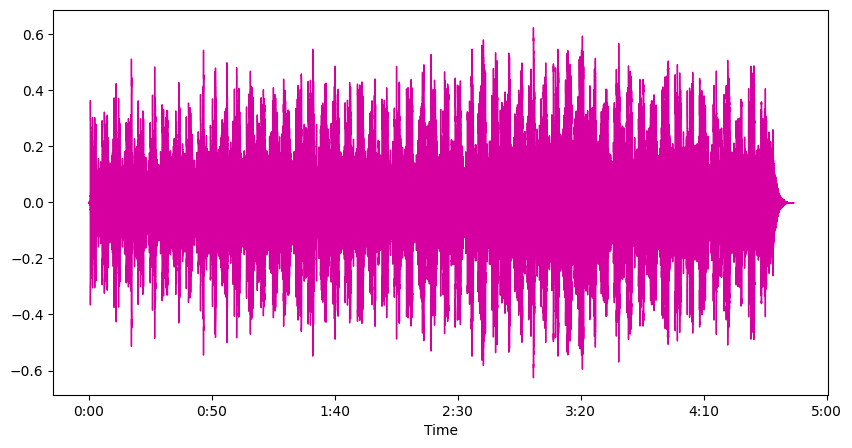

In [49]:
figure, axis = plt.subplots(1, figsize=(10, 5)) 

librosa.display.waveshow(x, sr=sr, color = "#d600a1") 

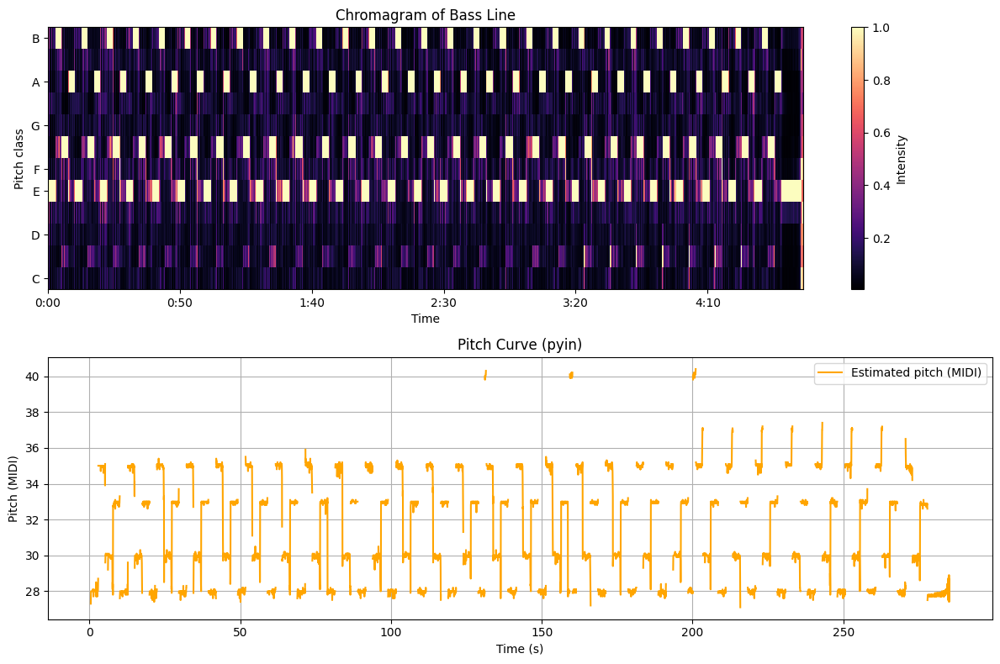

In [50]:
### Chatgpt
# 1. Load audio
y, sr = librosa.load(input_cleaned_filename)

# 2. Estimate pitch (fundamental frequency) with probabilistic YIN (good for bass)
f0, voiced_flag, voiced_prob = librosa.pyin(
    y,
    fmin=30,          # ~low B (adjust if your bass goes lower/higher)
    fmax=220,         # ~A3
    frame_length=2048,
    hop_length=512
)

# 3. Convert frequency to MIDI numbers for plotting
f0_midi = librosa.hz_to_midi(f0)

# 4. Compute chromagram (energy of each pitch class)
chroma = librosa.feature.chroma_cqt(y=y, sr=sr, hop_length=512)

# 5. Plot
plt.figure(figsize=(12, 8))

# --- Chromagram ---
plt.subplot(2, 1, 1)
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', hop_length=512, sr=sr)
plt.colorbar(label='Intensity')
plt.title('Chromagram of Bass Line')

# --- Pitch curve over time ---
plt.subplot(2, 1, 2)
times = librosa.times_like(f0, sr=sr, hop_length=512)
plt.plot(times, f0_midi, label='Estimated pitch (MIDI)', color='orange')
plt.xlabel('Time (s)')
plt.ylabel('Pitch (MIDI)')
plt.title('Pitch Curve (pyin)')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()



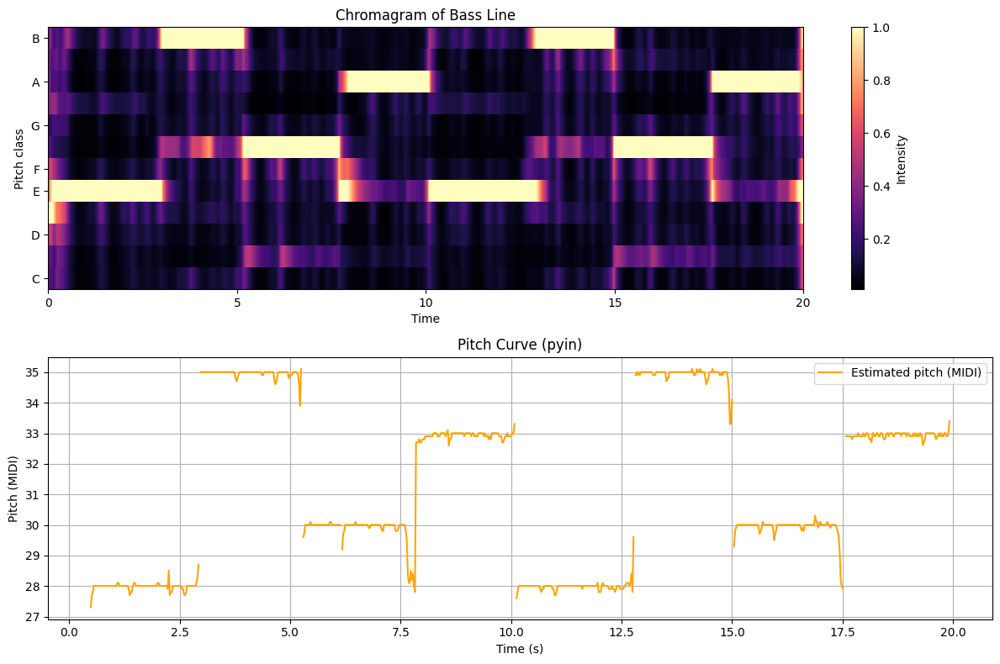

In [51]:
### Chatgpt
# 1. Load audio
y, sr = librosa.load(input_cleaned_filename)
y = y[:seconds * sr]
# 2. Estimate pitch (fundamental frequency) with probabilistic YIN (good for bass)
f0, voiced_flag, voiced_prob = librosa.pyin(
    y,
    fmin=30,          # ~low B (adjust if your bass goes lower/higher)
    fmax=220,         # ~A3
    frame_length=2048,
    hop_length=512
)

# 3. Convert frequency to MIDI numbers for plotting
f0_midi = librosa.hz_to_midi(f0)

# 4. Compute chromagram (energy of each pitch class)
chroma = librosa.feature.chroma_cqt(y=y, sr=sr, hop_length=512)

# 5. Plot
plt.figure(figsize=(12, 8))

# --- Chromagram ---
plt.subplot(2, 1, 1)
librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', hop_length=512, sr=sr)
plt.colorbar(label='Intensity')
plt.title('Chromagram of Bass Line')

# --- Pitch curve over time ---
plt.subplot(2, 1, 2)
times = librosa.times_like(f0, sr=sr, hop_length=512)
plt.plot(times, f0_midi, label='Estimated pitch (MIDI)', color='orange')
plt.xlabel('Time (s)')
plt.ylabel('Pitch (MIDI)')
plt.title('Pitch Curve (pyin)')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()



In [52]:
x_custom_time

array([-7.2759576e-12,  7.2759576e-11,  2.1827873e-11, ...,
        4.9759194e-02,  5.1843565e-02,  5.3941268e-02],
      shape=(441000,), dtype=float32)

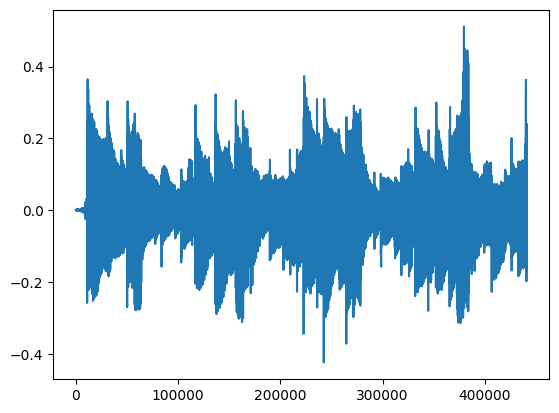

In [53]:
plt.plot(x_custom_time)

### Visualise while Playing

In [ ]:
input_custom_time_filename = "mp3_input/bass_NGHYB_clean_20_seconds.mp3"
# sf.write(input_custom_time_filename, x_custom_time, sr)

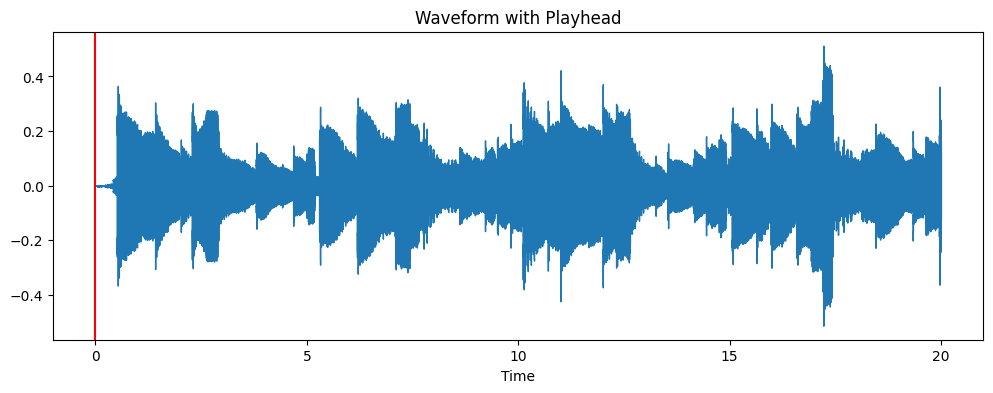

In [62]:
# Load audio
y, sr = librosa.load(input_custom_time_filename)

# Plot waveform
fig, ax = plt.subplots(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr, ax=ax)
ax.set_title("Waveform with Playhead")

# Add a vertical line for the playhead
playhead = ax.axvline(0, color='red')

# Playback duration
duration = len(y) / sr

# Start audio playback
sd.play(y, sr)

# Animation update: move the line according to time
def update(frame):
    t = frame / 100  # frame index → time (s), 100 fps
    playhead.set_xdata([t])
    return playhead,

ani = FuncAnimation(fig, update, frames=int(duration * 100),
                    interval=10, blit=True, repeat=False)

plt.show()

sd.wait()  # wait for playback to finish

### Plotly

In [64]:
import numpy as np
import librosa
import plotly.graph_objects as go
import sounddevice as sd
from IPython.display import display

# --- Load audio ---
audio_path = input_custom_time_filename          # replace with your file
y, sr = librosa.load(audio_path, sr=None)
duration = len(y) / sr
times = np.arange(len(y)) / sr

# --- Build the Plotly figure ---
fig = go.Figure()

# Waveform trace
fig.add_trace(go.Scatter(x=times, y=y,
                         mode='lines',
                         name='Waveform',
                         line=dict(color='royalblue', width=1)))

# Playhead (vertical line)
fig.add_shape(type="line",
              x0=0, x1=0,
              y0=y.min(), y1=y.max(),
              line=dict(color="red", width=2),
              name="playhead")

fig.update_layout(
    title="Interactive Waveform with Playhead",
    xaxis_title="Time (s)",
    yaxis_title="Amplitude",
    xaxis=dict(range=[0, duration]),
    showlegend=False,
    margin=dict(l=40, r=40, t=40, b=40),
)

display(fig)

# --- Play audio & update playhead ---
# Plotly's figure is static once drawn, so we move the line by redrawing shapes
# (works inside notebook or script, but not a high-fps animation)
import time

sd.play(y, sr)

n_steps = 200           # number of updates for the playhead
interval = duration / n_steps

for i in range(n_steps + 1):
    x = i * interval
    fig.update_shapes(dict(x0=x, x1=x), selector=dict(name="playhead"))
    time.sleep(interval)

sd.wait()


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'line': {'color': 'royalblue', 'width': 1},
              'mode': 'lines',
              'name': 'Waveform',
              'type': 'scatter',
              'x': {'bdata': ('AAAAAAAAAAB38VHH+MYHP3fxUcf4xh' ... 'ViFff/M0AszkEO+v8zQBbnIAf9/zNA'),
                    'dtype': 'f8'},
              'y': {'bdata': ('gq14txoUgrdiZoe39UOMt+yikLdEfJ' ... 'A2PRcRMz2o+kk9utJAPaxVXD2g0k49'),
                    'dtype': 'f4'}}],
    'layout': {'margin': {'b': 40, 'l': 40, 'r': 40, 't': 40},
               'shapes': [{'line': {'color': 'red', 'width': 2},
                           'name': 'playhead',
                           'type': 'line',
                           'x0': 0,
                           'x1': 0,
                           'y0': np.float32(-0.4223451),
                           'y1': np.float32(0.5121962)}],
               'showlegend': False,
               'template': '...',
               'title': {'text': 'Interactive Waveform with Playhead'},
               'xaxis': {'range': [0, 20.0], 'title': {'text': 'Time (s)'}},
               'yaxis': {'title': {'text': 'Amplitude'}}}
})